In [1]:


import torch
import torch.nn as nn
import numpy as np
import pandas as pd

from torch.utils.data import Dataset

import pandas, random, numpy
import matplotlib.pyplot as plt

from PIL import Image, ImageOps


import glob
import PIL

from sklearn.model_selection import train_test_split


In [2]:

civs_path = 'data/imgs.new.CIVS'


In [3]:

path  = civs_path

paths = glob.glob(path + "/*.jpg") # Grabbing all the image file names

n_images = len(paths)

rand_idxs = np.random.permutation(n_images)

paths_subset = np.random.choice(paths, n_images , replace=False) 
all_paths    = paths_subset[rand_idxs]

print(n_images)


5016


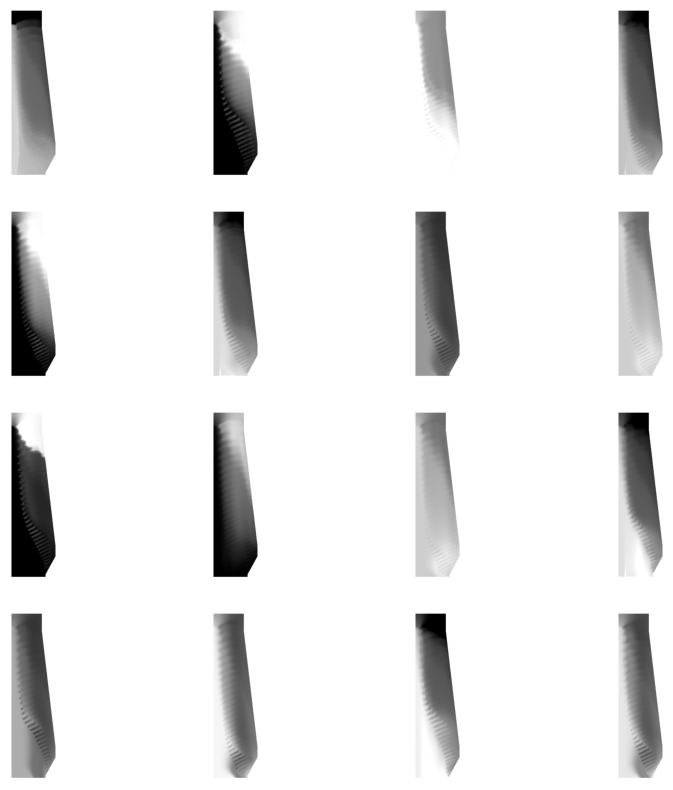

In [4]:

_, axes = plt.subplots(4, 4, figsize=(10, 10))

for ax, img_path in zip(axes.flatten(), all_paths):
    ax.imshow(Image.open(img_path))
    ax.axis("off")


In [5]:

## data/imgs.new.CIVS/h2_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow3.0_Hbt1410_Wm12.2_Wr308750.4.jpg
## data/imgs.new.CIVS/h2o_Ng0_Pci150_H0_Wp0_Ph300_Ox24_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg
## data/imgs.new.CIVS/h2_Ng40_Pci60_H0_Wp0_Ph300_Ox23_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg

    
## ['tg', 'Ng0', 'Pci175', 'H0', 'Wp0', 'Ph300', 'Ox24', 'Ow7', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']
    


In [6]:

'''

['tg',  'Ng120', 'Pci0', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow3.0', 'Hbt1485', 'Wm12.2', 'Wr308750.4']
['h2o', 'Ng70', 'Pci0', 'H0', 'Wp0', 'Ph500', 'Ox24', 'Ow5.0', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']
['co2', 'Ng50', 'Pci200', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow4', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']


'''


"\n\n['tg',  'Ng120', 'Pci0', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow3.0', 'Hbt1485', 'Wm12.2', 'Wr308750.4']\n['h2o', 'Ng70', 'Pci0', 'H0', 'Wp0', 'Ph500', 'Ox24', 'Ow5.0', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']\n['co2', 'Ng50', 'Pci200', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow4', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']\n\n\n"

In [7]:

def label_func2(fname):
    ## print(fname)
    fname = fname.replace("data/imgs.new.CIVS/","")
    temp_name = fname.replace(".jpg", "").split("_")
    ## print(temp_name)
    
  
    y0 = temp_name[0]                              ## tg
    y1 = float(temp_name[1].replace("Ng", ""))     ## 'Ng0'
    y2 = float(temp_name[2].replace("Pci", ""))    ## 'Pci175'
    y3 = float(temp_name[3].replace("H", ""))     ## 'H0'
    y4 = float(temp_name[4].replace("Wp", ""))     ## 'Wp0'
    y5 = float(temp_name[5].replace("Ph", ""))     ## 'Ph300'
    y6 = float(temp_name[6].replace("Ox", ""))    ## 'Ox24'
    y7 = float(temp_name[7].replace("Ow", ""))     ## 'Ow7
    y8 = float(temp_name[8].replace("Hbt", ""))    ## 'Hbt1459.8'
    y9 = float(temp_name[9].replace("Wm", ""))    ## 'Wm12.2'
    y10 = float(temp_name[10].replace("Wr", ""))    ## 'Wr308750.4'
    
 
    ## np.array([y0, y1, y2, y3, y4, y5, y6, y7, y8, y9, y10 ])
    return [fname, y0, y1, y2, y3, y4, y5, y6, y7, y8, y9, y10 ]


In [8]:

## 1400, 390
## x 0.2
## 280 , 78
## 140, 39   ## for web tool


list_imgs = []
list_label_vectors = []

for img_name in all_paths:
    ##print(img_name)
    
    my_img = Image.open(img_name)
    
    my_img = my_img.resize((195, 700))

    my_img = ImageOps.grayscale(my_img)

    img_np = np.array(my_img)
    
    ## data = np.array(my_img)
    ## print(data)
    ## input()

    ## img_np = img_np.reshape(-1)
    
    temp_label_vector_rc = label_func2(img_name)
    if temp_label_vector_rc[1] == "tg":
    
        ## print(img_np.shape)
        list_imgs.append(img_np)

        list_label_vectors.append( temp_label_vector_rc )


In [9]:

X =  list_imgs
y =  list_label_vectors 


In [10]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

#######################################################

print(len(X_train))
print(len(X_test))
print(len(y_train))
print(len(y_test))


668
168
668
168


In [11]:

X_train[0]


array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [12]:

list_ids_train      = []
list_features_train = []
list_imgs_train     = []


for index in range(len(X_train)):
    
    # image target (label)
    reg_vals = y_train[index]
    target = np.zeros( (10) )
    
    target[ 0 ] = reg_vals[2]
    target[ 1 ] = reg_vals[3]
    target[ 2 ] = reg_vals[4]
    target[ 3 ] = reg_vals[5]
    target[ 4 ] = reg_vals[6]
    target[ 5 ] = reg_vals[7]
    target[ 6 ] = reg_vals[8]
    target[ 7 ] = reg_vals[9]
    target[ 8 ] = reg_vals[10]
    target[ 9 ] = reg_vals[11]

    # image data, normalised from 0-255 to 0-1
    single_np_img = X_train[index]
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ) / 255.0
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ).permute(2,0,1).view(1,3,280,80) / 255.0
    

        
    list_ids_train.append(          reg_vals[0]                )
    list_imgs_train.append(        single_np_img               )
    list_features_train.append(    target      )


In [13]:

list_imgs_train[0]


array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [14]:


list_ids_test      = []
list_features_test = []
list_imgs_test     = []


for index in range(len(X_test)):
    
    # image target (label)
    reg_vals = y_test[index]
    target = np.zeros( (10) )
    
    target[ 0 ] = reg_vals[2]
    target[ 1 ] = reg_vals[3]
    target[ 2 ] = reg_vals[4]
    target[ 3 ] = reg_vals[5]
    target[ 4 ] = reg_vals[6]
    target[ 5 ] = reg_vals[7]
    target[ 6 ] = reg_vals[8]
    target[ 7 ] = reg_vals[9]
    target[ 8 ] = reg_vals[10]
    target[ 9 ] = reg_vals[11]

    # image data, normalised from 0-255 to 0-1
    single_np_img = X_test[index]
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ) / 255.0
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ).permute(2,0,1).view(1,3,280,80) / 255.0
        
    list_ids_test.append(          reg_vals[0]                )
    list_imgs_test.append(        single_np_img               )
    list_features_test.append(    target      )




In [15]:

conditions_matrix_train = np.array( list_features_train )
conditions_matrix_test  = np.array( list_features_test )


In [16]:

print( conditions_matrix_train.shape )
print( conditions_matrix_test.shape  )


(668, 10)
(168, 10)



## Save data for deployment


In [17]:


DF_conditions_train = pd.DataFrame(conditions_matrix_train)
DF_conditions_train.to_csv("PD_conditions_train.csv")


In [18]:

DF_ids_train = pd.DataFrame(list_ids_train)
DF_ids_train.to_csv("PD_ids_train.csv")


In [19]:

list_imgs_train[17]
    


array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

In [20]:

list_imgs_train[17].shape


(700, 195)

In [21]:

list_imgs_train_stretched = [     the_img_np.reshape(-1)         for the_img_np in list_imgs_train]


In [22]:

list_imgs_train_stretched[0]


array([255, 255, 255, ..., 255, 255, 255], dtype=uint8)

In [23]:

list_imgs_train_stretched[4].shape


(136500,)

In [24]:

list_imgs_train_stretched[4][:1000]


array([255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 25

In [25]:

list_imgs_train_stretched[7].shape


(136500,)


## Keeps scale at 0..255


In [26]:

np_list_imgs_train_stretched = np.array( list_imgs_train_stretched )  


In [27]:

np_list_imgs_train_stretched.shape


(668, 136500)

In [28]:

np_list_imgs_train_stretched[3]


array([255, 255, 255, ..., 255, 255, 255], dtype=uint8)

In [29]:

DF_imgs_np_train = pd.DataFrame(np_list_imgs_train_stretched)


In [30]:

DF_imgs_np_train


,0,1,2,3,4,5,6,7,8,9,...,136490,136491,136492,136493,136494,136495,136496,136497,136498,136499
0,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
1,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
2,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
3,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
4,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
663,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
664,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
665,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
666,255,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255


In [31]:

DF_imgs_np_train.to_csv("PD_imgs_np_train.csv")



## Break up data for GitHub


In [32]:


# read DataFrame
break_up_data = pd.read_csv("PD_imgs_np_train.csv")
 
# no of csv files with row size
k = 15     ## k csv's
size = 47  ## n rows
 
for i in range(k):
    df = break_up_data[size*i:size*(i+1)]
    df.to_csv(f'Imgs_Furnace_{i+1}.csv', index=False)
 



## KNN part


In [33]:

def euclidean_distance(v1, v2):
    return np.sqrt( np.sum(   (v1 - v2)**2   )   )


In [34]:

def predict(test_x):
    
    ## calculate distances between test_x and all dta samples in x
    ## this distances vector is a vector of 45 distances
    ## distances = [ euclidean_distance(test_x , x)  for x in X_train    ]

    distances = [ euclidean_distance(test_x, x )  for x in conditions_matrix_train   ]
      
    
    ## distances - > [23, 3, 145, 17, ...]
    
    k = 3
    
    ## sort by distance value and return the k nearest neighbors
    ## np.argsort returns the indices of the k neares neighbors
    k_neighbor_indices = np.argsort(distances)[:k]
    print(k_neighbor_indices)
    
    
    ## with indices, extract labels from y_train 
    img_names = [ list_ids_train[i]  for i in k_neighbor_indices  ]
    ## imagine labels = [ 1, 1, 2, 0, 1]
    
    ## from labels, select the most common label
    ## most_common_label = Counter(labels).most_common(1)
    
    return img_names
    


In [35]:

def generate_img_per_index(index):
    
    res = predict( conditions_matrix_test[  index  ] )
    the_test_conditions = conditions_matrix_test[  index  ]
    print(res)
      
    selected_imgs_to_avg = []

    for img_name in res:
        img_name = "data/imgs.new.CIVS/" + img_name
        my_img = Image.open(img_name)
        ## my_img = my_img.resize((80, 280))
        my_img = ImageOps.grayscale(my_img)
        img_np = np.array(my_img)
       
        
        ## img_np = img_np.reshape(-1)
        selected_imgs_to_avg.append(img_np)
    avg_gen_img = np.mean( np.array(selected_imgs_to_avg), axis=0 )
    print(avg_gen_img.shape)
    print(avg_gen_img)
    gen_pil_image  = Image.fromarray(avg_gen_img).convert('L')
    print(gen_pil_image)
    
    real_my_img = np.array(list_imgs_test[index])
    real_pil_image = Image.fromarray(real_my_img)
    real_pil_image = ImageOps.grayscale(real_pil_image)
    
    print(gen_pil_image)
    print(real_pil_image)
    
    return the_test_conditions, gen_pil_image, real_pil_image
    



## Inference


(668, 10)
(168, 10)
[288 215 224]
['tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow9.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow7.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow6.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC6D6590B90>
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC6D6590B90>
<PIL.Image.Image image mode=L size=195x700 at 0x7FC6815B5D50>
70,0,0,0,300,21,8,1410,12,308750


Text(0.5, 1.0, 'real')

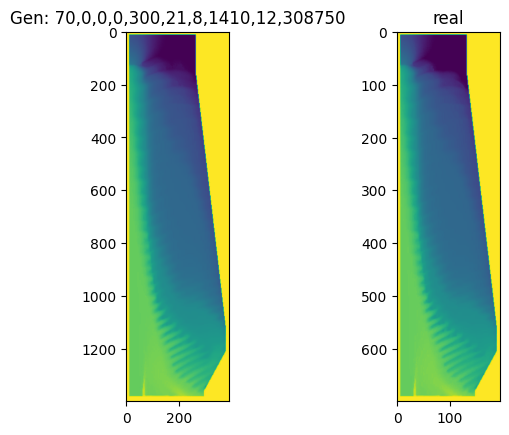

In [36]:



print( conditions_matrix_train.shape )
print( conditions_matrix_test.shape  )

the_test_conditions, gen_pil_image, real_pil_image = generate_img_per_index(17)


the_test_conditions = the_test_conditions.astype(int)
str_conditions = np.array2string(the_test_conditions, precision=0, separator=',', suppress_small=True)
str_conditions = str_conditions.replace(" ","")
str_conditions = str_conditions.replace("[","")
str_conditions = str_conditions.replace("]","")

print(str_conditions)
                 

fig, ax = plt.subplots(1,2)

ax[0].imshow(gen_pil_image)
ax[1].imshow(real_pil_image)

ax[0].set_title("Gen: " + str_conditions)
ax[1].set_title("real")




(668, 10)
(168, 10)
[129 457 314]
['tg_Ng38_Pci0_H0_Wp0_Ph300_Ox21_Ow9.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng38_Pci0_H0_Wp0_Ph300_Ox21_Ow6.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng38_Pci0_H0_Wp0_Ph300_Ox24_Ow8.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC651E2AE10>
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC651E2AE10>
<PIL.Image.Image image mode=L size=195x700 at 0x7FC651E2AB50>
[166 444 319]
['tg_Ng0_Pci175_H0_Wp0_Ph300_Ox27_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci175_H0_Wp0_Ph300_Ox21_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci175_H0_Wp0_Ph300_Ox24_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 2

[288 215 224]
['tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow9.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow7.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow6.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC5861E1D90>
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC5861E1D90>
<PIL.Image.Image image mode=L size=195x700 at 0x7FC5861E1E90>
[312 441 174]
['tg_Ng38_Pci0_H0_Wp0_Ph300_Ox24_Ow6.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng38_Pci0_H0_Wp0_Ph300_Ox24_Ow4.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng38_Pci0_H0_Wp0_Ph300_Ox24_Ow7.0_Hbt1485_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]

/Users/user/opt/anaconda3/envs/py37_new_GANs_Torch/lib/python3.7/site-packages/ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()


(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC5860D3690>
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC5860D3690>
<PIL.Image.Image image mode=L size=195x700 at 0x7FC58646A410>
[248 172  10]
['tg_Ng0_Pci38_H0_Wp0_Ph300_Ox21_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci38_H0_Wp0_Ph300_Ox21_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci38_H0_Wp0_Ph300_Ox21_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC5DFEE7250>
<PIL.Image.Image image mode=L size=390x1400 

(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC5982C8210>
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC5982C8210>
<PIL.Image.Image image mode=L size=195x700 at 0x7FC5875B7D90>
[196 284 104]
['tg_Ng0_Pci38_H0_Wp0_Ph300_Ox30_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci38_H0_Wp0_Ph300_Ox27_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci38_H0_Wp0_Ph300_Ox30_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC59FA4C850>
<PIL.Image.Image image mode=L size=390x1400 

[526 407 434]
['tg_Ng150_Pci0_H0_Wp0_Ph300_Ox27_Ow8.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox27_Ow6.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox27_Ow5.0_Hbt1485_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC581292350>
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC581292350>
<PIL.Image.Image image mode=L size=195x700 at 0x7FC581292250>
[271 325 599]
['tg_Ng0_Pci90_H0_Wp0_Ph300_Ox21_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci90_H0_Wp0_Ph300_Ox21_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci90_H0_Wp0_Ph300_Ox21_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 25

[525 467 591]
['tg_Ng150_Pci0_H0_Wp0_Ph300_Ox24_Ow8.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox24_Ow7.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox24_Ow6.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC59D022A50>
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC59D022A50>
<PIL.Image.Image image mode=L size=195x700 at 0x7FC59D06F310>
[300 237 163]
['tg_Ng70_Pci0_H0_Wp0_Ph500_Ox24_Ow9.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph500_Ox24_Ow6.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph500_Ox24_Ow5.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 2

[336 457  88]
['tg_Ng38_Pci0_H0_Wp0_Ph300_Ox21_Ow5.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng38_Pci0_H0_Wp0_Ph300_Ox21_Ow6.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng38_Pci0_H0_Wp0_Ph300_Ox24_Ow4.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC58291DDD0>
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC58291DDD0>
<PIL.Image.Image image mode=L size=195x700 at 0x7FC58291DCD0>
[562 611 591]
['tg_Ng150_Pci0_H0_Wp0_Ph300_Ox24_Ow4.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox27_Ow3.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox24_Ow6.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 25

[212 613  51]
['tg_Ng160_Pci40_H0_Wp0_Ph300_Ox27_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng160_Pci40_H0_Wp0_Ph300_Ox27_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng160_Pci40_H0_Wp0_Ph300_Ox27_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC5838AB210>
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC5838AB210>
<PIL.Image.Image image mode=L size=195x700 at 0x7FC5838AB110>
[457 336 129]
['tg_Ng38_Pci0_H0_Wp0_Ph300_Ox21_Ow6.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng38_Pci0_H0_Wp0_Ph300_Ox21_Ow5.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng38_Pci0_H0_Wp0_Ph300_Ox21_Ow9.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255.

(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC584056990>
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC584056990>
<PIL.Image.Image image mode=L size=195x700 at 0x7FC584038D10>
[665  19 398]
['tg_Ng0_Pci70_H0_Wp0_Ph300_Ox24_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci70_H0_Wp0_Ph300_Ox24_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci70_H0_Wp0_Ph300_Ox24_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC5845773D0>
<PIL.Image.Image image mode=L size=390x1400 

(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC59E61F210>
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC59E61F210>
<PIL.Image.Image image mode=L size=195x700 at 0x7FC5840A8C10>
[120 255 575]
['tg_Ng30_Pci120_H0_Wp0_Ph300_Ox25_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng30_Pci120_H0_Wp0_Ph300_Ox25_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng30_Pci120_H0_Wp0_Ph300_Ox25_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC58525C550>
<PIL.Image.Image image mode=L size=390

(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC59ECF5910>
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC59ECF5910>
<PIL.Image.Image image mode=L size=195x700 at 0x7FC59ECCAD10>
[159 136 127]
['tg_Ng38_Pci0_H0_Wp0_Ph300_Ox27_Ow4.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng38_Pci0_H0_Wp0_Ph300_Ox27_Ow6.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng38_Pci0_H0_Wp0_Ph300_Ox27_Ow7.0_Hbt1485_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC585F47510>
<PIL.Image.Image image mode=L size=390x1400 

(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC59EF23810>
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC59EF23810>
<PIL.Image.Image image mode=L size=195x700 at 0x7FC59EEAEE90>
[666 505 650]
['tg_Ng90_Pci0_H0_Wp0_Ph300_Ox30_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox30_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow9_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC59F096650>
<PIL.Image.Image image mode=L size=390x1400 

[101 110 145]
['tg_Ng120_Pci0_H0_Wp0_Ph300_Ox27_Ow5.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci0_H0_Wp0_Ph300_Ox27_Ow7.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci0_H0_Wp0_Ph300_Ox27_Ow4.0_Hbt1485_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 ...
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]]
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC6C1475E50>
<PIL.Image.Image image mode=L size=390x1400 at 0x7FC6C1475E50>
<PIL.Image.Image image mode=L size=195x700 at 0x7FC6C1475F10>
[299 222 273]
['tg_Ng90_Pci0_H0_Wp0_Ph500_Ox24_Ow9.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph500_Ox24_Ow5.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph500_Ox21_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
[[255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255. 255.]
 [255. 255. 255. ... 255. 255

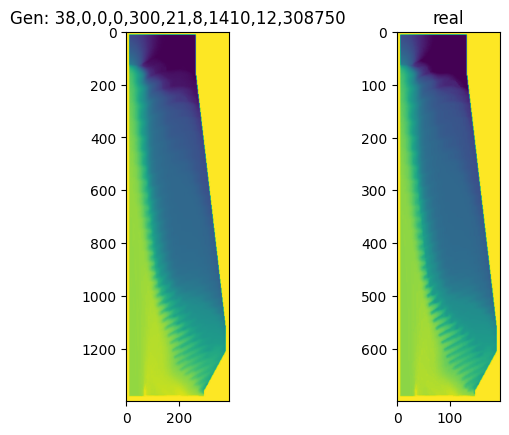

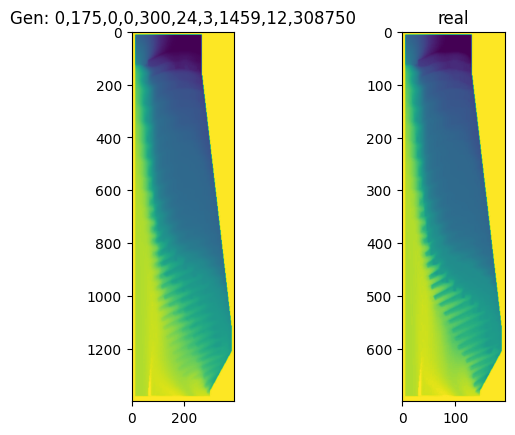

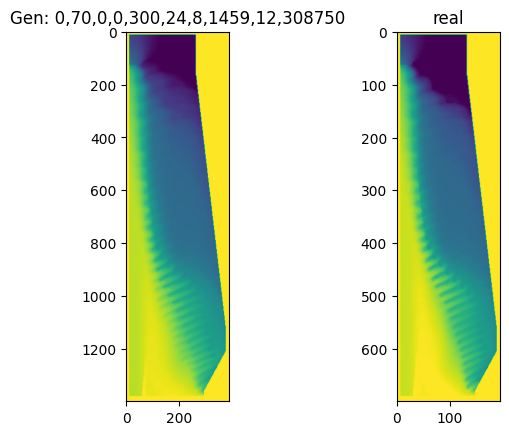

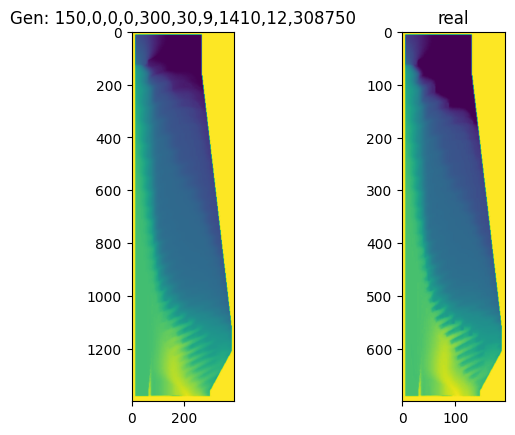

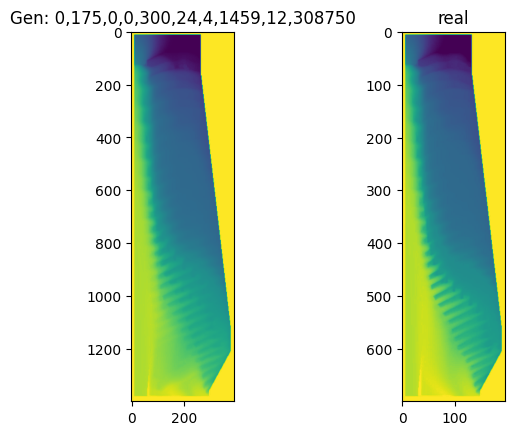

...

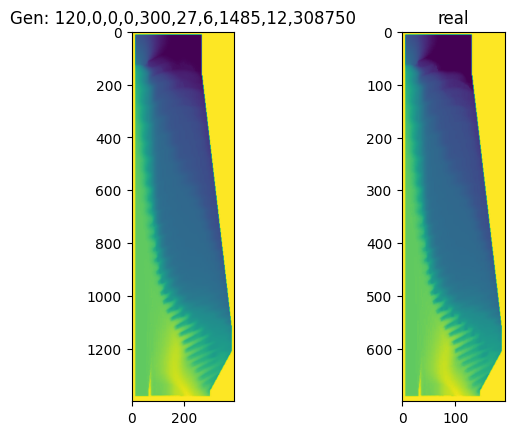

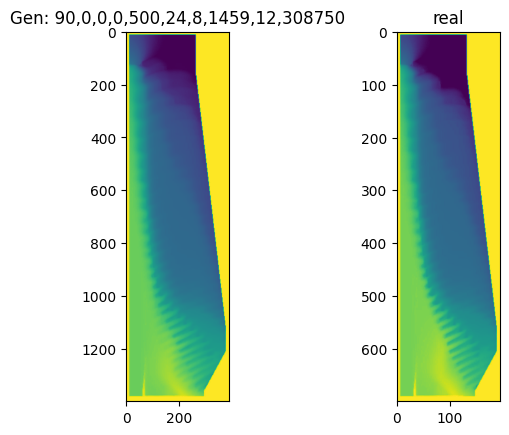

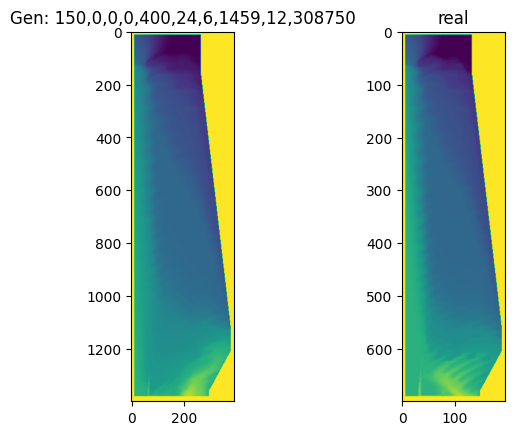

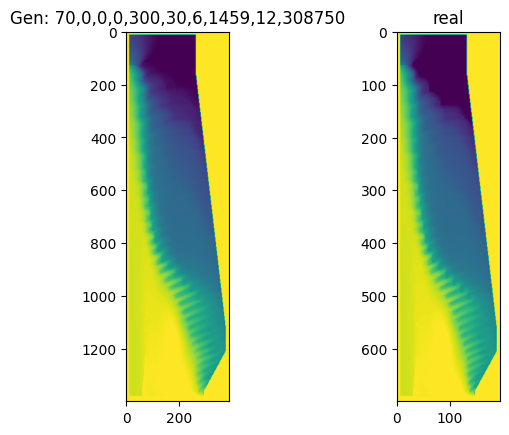

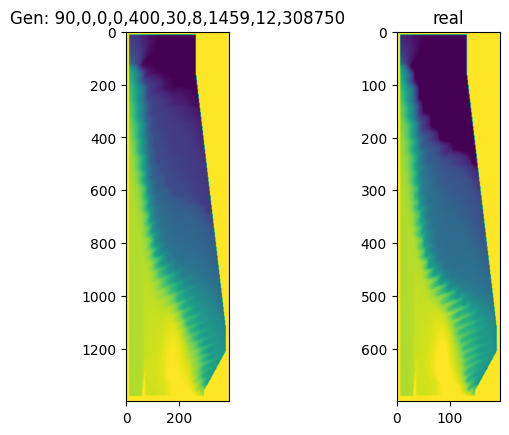

In [37]:

print( conditions_matrix_train.shape )
print( conditions_matrix_test.shape  )


for test_i in range( conditions_matrix_test.shape[0]  ):

    the_test_conditions, gen_pil_image, real_pil_image = generate_img_per_index(test_i)
    
    the_test_conditions = the_test_conditions.astype(int)
    str_conditions = np.array2string(the_test_conditions, precision=0, separator=',', suppress_small=True)
    str_conditions = str_conditions.replace(" ","")
    str_conditions = str_conditions.replace("[","")
    str_conditions = str_conditions.replace("]","")

    ## print(str_conditions)

    fig, ax = plt.subplots(1,2)
    ax[0].imshow(gen_pil_image)
    ax[1].imshow(real_pil_image)
    
    ax[0].set_title("Gen: " + str_conditions)
    ax[1].set_title("real")
